In [1]:
import os
import sys
from decimal import Decimal

import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
%matplotlib inline

module_path = os.path.abspath(os.path.join('../'))
if module_path not in sys.path:
    sys.path.append(module_path)
from m2py.utils import config
from m2py.utils import pre_processing as pre
from m2py.utils import post_processing as post
from m2py.utils import seg_label_utils as slu
from m2py.segmentation import segmentation_gmm as seg_gmm
from m2py.segmentation import segmentation_watershed as seg_water

This next cell is used to expedite plotting titles and labels, although these same channel names can be accessed using config.py

In [2]:
qnm_fields = ['Adhesion', 'Deformation', 'Dissipation', 'Modulus', 'Height', 'Stiffness']

## Read in data.

My data is usually structured so that the sample conditions and device information is easily accessed and callable through only the filenames.

The two files referenced in this notebook are available on Github for download as .npy files in the 'data/' folder

In [3]:
lit_files = '/Users/wesleytatum/Dropbox/SSTS_files/Manuscript/data_files/'

im_opv = np.load(lit_files+'175C_30min_Sub8_Dev8.npy')
im_PTB7 = np.load(lit_files+'PTB7PC71BM_CBonly_ascast_fresh_500 nm_combined.npy')

ims = [im_opv, im_PTB7]

## Define iterable classification workflow

- Data cleaning: FFT high pass filter, then outlier removal (blurring + z-score threshold)

- Feature selection: PCA and further channel reduction (_e.g._ 'heightless')

- Semantic Segmentation: GMM classifies pixels based on user input parameter, which corresponds to the number of anticipated phases in the image (_e.g._ binary blend would be expected to have 2 GMM components)

- Instance Segmentation: Either PWS or connected components is used to cluster pixels with same GMM label into morphological domains. PWS can be applied to any single channel (heigh is default, though PCA or material properties can also be used). Connected components only requires GMM label matrix

- Final outputs of workflow are GMM labels, instance segmentation labels, and the outlier flags

In [14]:
def m2py_pipeline(dataframe, heightless, outlier_threshold, n_components, padding, embedding_dim, thresh, nonlinear, normalize, zscale, data_type, data_subtype, input_cmap):
    """
    Wrapper function for m2py tools. Allows to include or exclude m2py tools in the order shown in the code.
    
    Args:
    dataframe - np.array(). 3D array of SPM data
    heightless - bool. if 'True', height channel is removed. Height is assumed to be dataframe[:,:,4]
    n_components - int. number specifying the number of Gaussian phase distributions to be identified in dataframe
    padding - int. number specifying the degree of closeness of neighbors to be included in GMM labelling
    embedding_dims - int. number specifying the number of principle components to use in PCA before GMM labelling
    nonlinear - bool. if 'True', nonlinear properties are generated prior to analysis. Includes x^2, x^3, abs(x),
                and 1/x
                
    Returns:
    outliers - np.array(). 2D array of outliers
    seg1_labels - np.array(). 2D array of GMM labels
    seg2_labels - np.array(). 2D array of clustering labels
    """
  
    fill_zeros_flag = True
    remove_outliers_flag = True
    input_cmap = input_cmap
    
    # Apply frequency removal
    data = pre.apply_frequency_removal(dataframe, data_type)
    
    data_properties = config.data_info[data_type]['properties']

    # Extract outliers
    outliers = pre.extract_outliers(data, data_type, threshold = outlier_threshold)
    no_outliers_data = pre.smooth_outliers_from_data(data, outliers)
    
    pre.show_outliers(dataframe, data_type, outliers)

    # Show a-priori distributions
    pre.show_property_distributions(data, data_type, outliers)

    c = data.shape[2]
    num_pca_components = min(embedding_dim, c)
    
    # Run GMM segmentation
    seg1 = seg_gmm.SegmenterGMM(n_components = n_components, embedding_dim = num_pca_components, padding = padding,
                                nonlinear = nonlinear, normalize=normalize, zscale=zscale)

    if heightless == True:
        # Remove height property
        height_id = data_properties.index("Height")
        
        no_height_data = np.delete(no_outliers_data, height_id, axis=2)

        seg1_labels = seg1.fit_transform(no_height_data, outliers)
        
        if fill_zeros_flag:
            seg1_labels = slu.fill_out_zeros(seg1_labels, outliers)

        elif remove_outliers_flag:
            seg1_labels = np.ma.masked_where(outliers == 1, pre_labels)

        post.show_classification(seg1_labels, no_height_data, data_type)
        post.show_classification_correlation(seg1_labels, no_height_data, data_type)
        post.show_distributions_together(seg1_labels, no_height_data, data_type, input_cmap = 'jet')
        post.show_grain_area_distribution(seg1_labels, data_type, data_subtype)

        # Overlay distributions on pixels
        probs = seg1.get_probabilities(no_height_data)
        post.show_overlaid_distribution(probs, no_height_data, data_type)
        
        if embedding_dim != None:
            h, w, c = no_height_data.shape

            pca_components = seg1.get_pca_components(no_height_data)
            pca_components = pca_components.reshape(h, w, num_pca_components)
            post.show_classification_correlation(seg1_labels, pca_components, data_type, title_flag=False)

            post.show_classification_distributions(seg1_labels, pca_components, data_type, title_flag=False)

        else:
            pass
            
#         X = np.ravel(seg1_labels)
#         for i in range(5):
#             Y = np.ravel(no_height_data[:,:,i])
#             plt.scatter(X, Y, s = 50, marker = 'o', color = 'r', alpha = 0.1)
#             plt.ticklabel_format(style = 'sci')
#             plt.ylim((Y.min()-Y.min()*0.5), (Y.max()+Y.max()*0.1))
#             plt.show()

## Persistence Watershed Segmentation clustering
    
        if thresh != None:
        
            seg2 = seg_water.SegmenterWatershed()
            height_id = data_properties.index("Height")
            height_data = data[:, :, height_id]
            thresh = thresh

            seg2_labels = seg2.fit_transform(height_data, outliers, thresh)
            
                                                                        ## This is incorporates GMM labels into PWS
            
            seg2_labels[seg1_labels == 1] = np.max(seg1_labels) + 1 # map background label of gmm to next pws label
            for l in np.unique(seg2_labels): # clean up small pws labels
                if np.sum(seg2_labels == l) < 2000:
                    seg2_labels = slu.fill_out_zeros(seg2_labels, seg2_labels == l)

            seg2_labels = slu.get_significant_labels(seg2_labels, bg_contrast_flag=True)
            post.show_classification(seg2_labels, no_height_data, data_type)

## Conected-components clustering
        else:
            post_labels = seg1.get_grains(seg1_labels)
            seg2_labels = slu.get_significant_labels(post_labels, bg_contrast_flag=True)

        post.show_classification(seg2_labels, no_height_data, data_type, input_cmap = input_cmap)
        post.show_grain_area_distribution(seg2_labels, data_type, data_subtype)
        
#         X = np.ravel(seg2_labels)
#         for i in range(5):
#             Y = np.ravel(no_height_data[:,:,i])
#             plt.scatter(X, Y, s = 50, marker = 'o', color = 'r', alpha = 0.1)
#             plt.ticklabel_format(style = 'sci')
#             plt.ylim((Y.min()-Y.min()*0.5), (Y.max()+Y.max()*0.1))
#             plt.show()

        
    elif heightless == False:
        
        seg1_labels = seg1.fit_transform(no_outliers_data, outliers)
        
        if fill_zeros_flag:
            seg1_labels = slu.fill_out_zeros(seg1_labels, outliers)

        elif remove_outliers_flag:
            seg1_labels = np.ma.masked_where(outliers == 1, pre_labels)

        post.show_classification(seg1_labels, no_outliers_data, data_type)
        post.show_distributions_together(seg1_labels, no_outliers_data, data_type, input_cmap = input_cmap)

        post.show_classification(seg1_labels, no_outliers_data, data_type)
        post.show_classification_correlation(seg1_labels, no_outliers_data, data_type)
        post.show_distributions_together(seg1_labels, no_outliers_data, data_type, input_cmap = input_cmap)

        # Overlay distributions on pixels
        probs = seg1.get_probabilities(no_outliers_data)
        post.show_overlaid_distribution(probs, no_outliers_data, data_type)
        post.show_grain_area_distribution(seg1_labels, data_type, data_subtype)
        
        
        if embedding_dim != None:
            h, w, c = no_outliers_data.shape

            pca_components = seg1.get_pca_components(no_outliers_data)
            pca_components = pca_components.reshape(h, w, num_pca_components)
            post.show_classification_correlation(seg1_labels, pca_components, data_type, title_flag=False)

            post.show_classification_distributions(seg1_labels, pca_components, data_type, title_flag=False)

            
        else:
            pass
            
#         X = np.ravel(seg1_labels)
#         for i in range(6):
#             Y = np.ravel(no_outliers_data[:,:,i])
#             plt.scatter(X, Y, s = 50, marker = 'o', color = 'r', alpha = 0.1)
#             plt.ticklabel_format(style = 'sci')
#             plt.ylim((Y.min()-Y.min()*0.5), (Y.max()+Y.max()*0.1))
#             plt.show()
        
## Persistence Watershed Segmentation clustering
    
        if thresh != None:
        
            seg2 = seg_water.SegmenterWatershed()           
            height_id = data_properties.index("Height")
            height_data = data[:, :, height_id]
            thresh = thresh

            seg2_labels = seg2.fit_transform(height_data, outliers, thresh)

                                                            ## This is incorporates GMM labels into PWS
            
            seg2_labels[seg1_labels == 1] = np.max(seg2_labels) + 1 # map background label of gmm to next pws label
            for l in np.unique(seg2_labels): # clean up small pws labels
                if np.sum(seg2_labels == l) < 2000:
                    seg2_labels = slu.fill_out_zeros(seg2_labels, seg2_labels == l)

            seg2_labels = slu.get_significant_labels(seg2_labels, bg_contrast_flag=True)
            post.show_classification(seg2_labels, no_outliers_data, data_type)

## Conected-components clustering
        else:
            post_labels = seg1.get_grains(seg1_labels)
            seg2_labels = slu.get_significant_labels(post_labels, bg_contrast_flag=False)
        
        post.show_classification(seg2_labels, no_outliers_data, data_type, input_cmap = input_cmap)
        post.show_grain_area_distribution(seg2_labels, data_type, data_subtype)

#         X = np.ravel(seg2_labels)
#         for i in range(6):
#             Y = np.ravel(no_outliers_data[:,:,i])
#             plt.scatter(X, Y, s = 50, marker = 'o', color = 'r', alpha = 0.1)
#             plt.ticklabel_format(style = 'sci')
#             plt.ylim((Y.min()-Y.min()*0.5), (Y.max()+Y.max()*0.1))
#             plt.show()
        
    else:
        print ('Error: Heightless flag incorrect')
    
    return outliers, seg1_labels, seg2_labels

## Apply workflow to images iterably and collect results in dictionaries

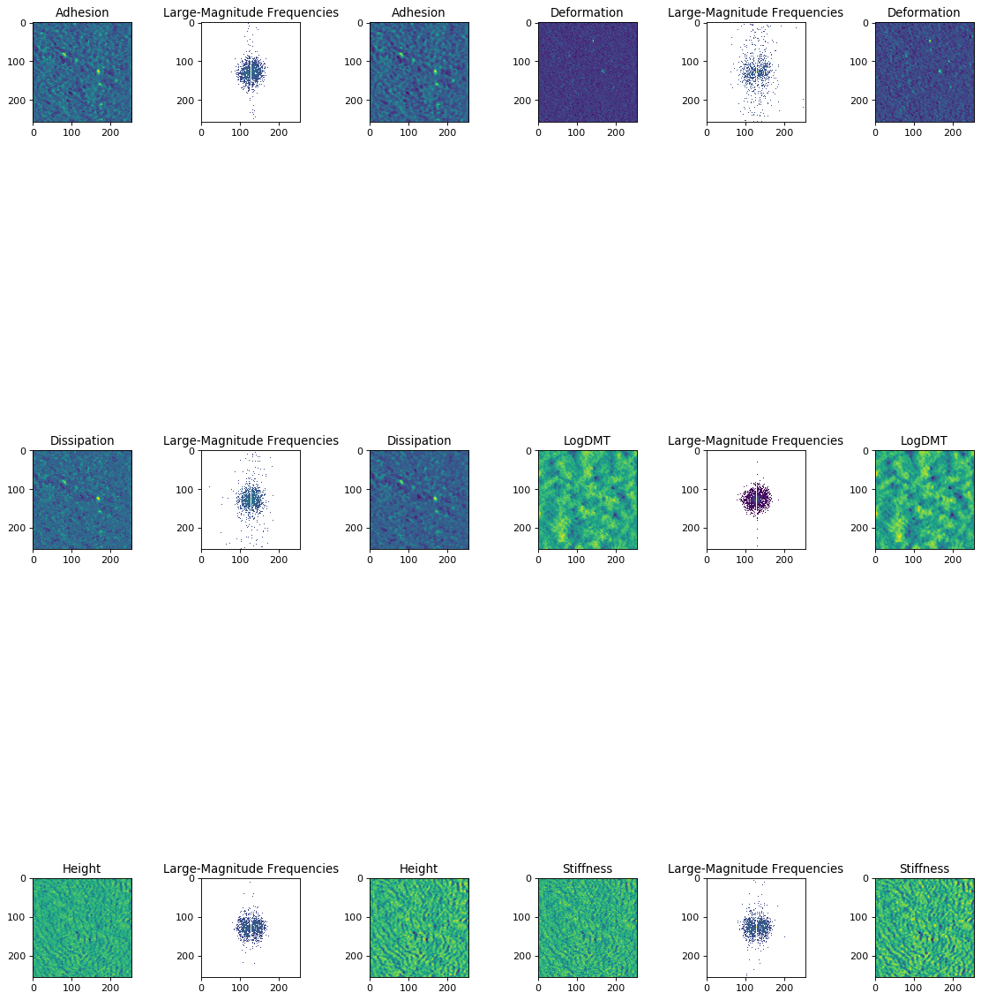

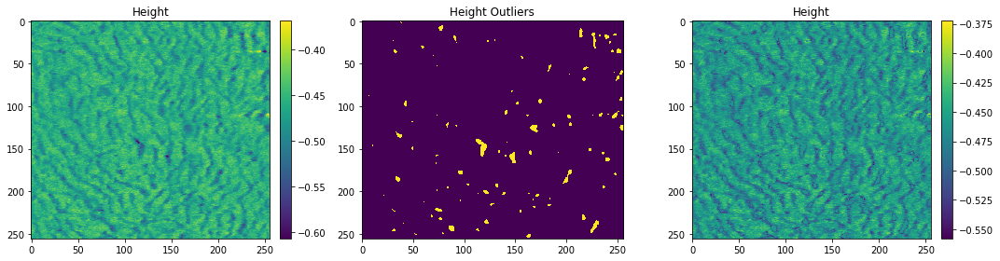

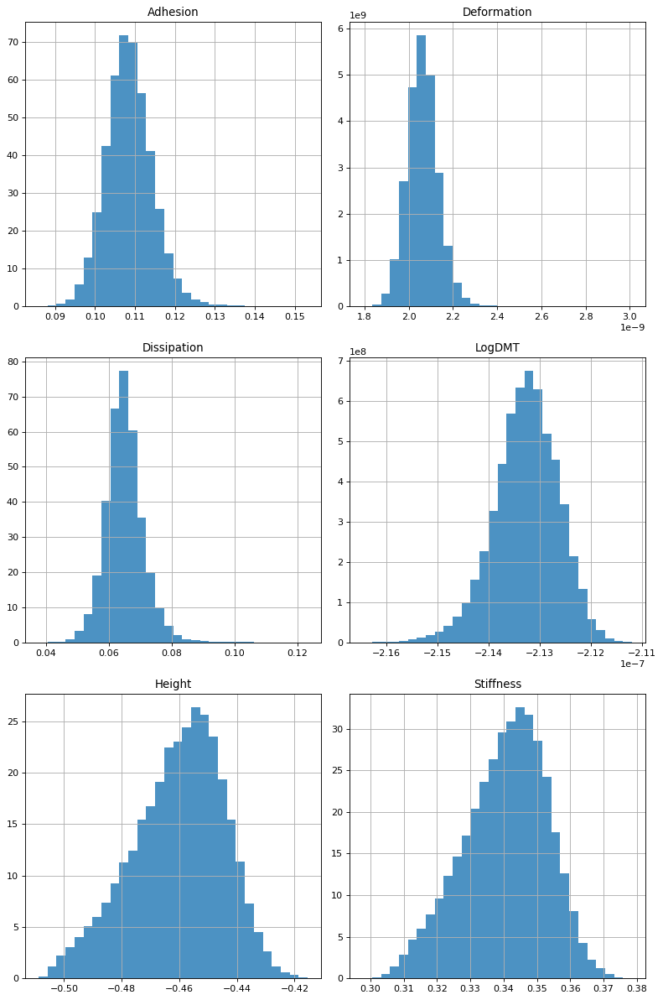

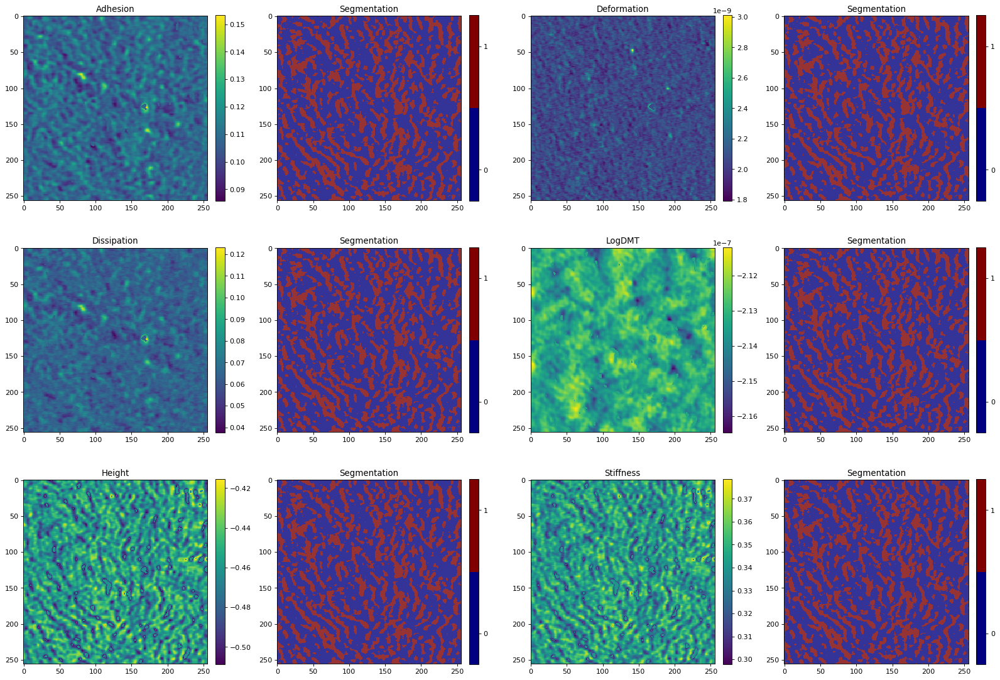

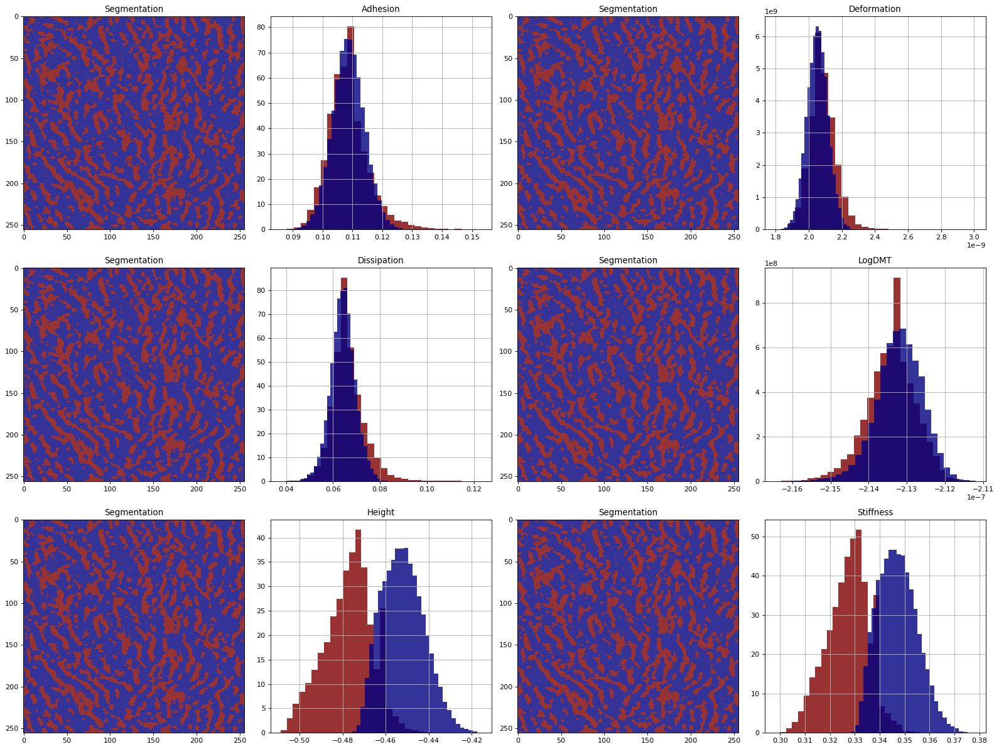

...

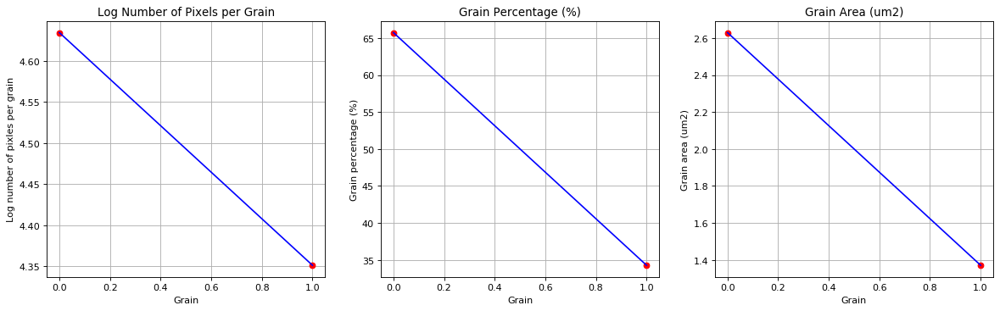

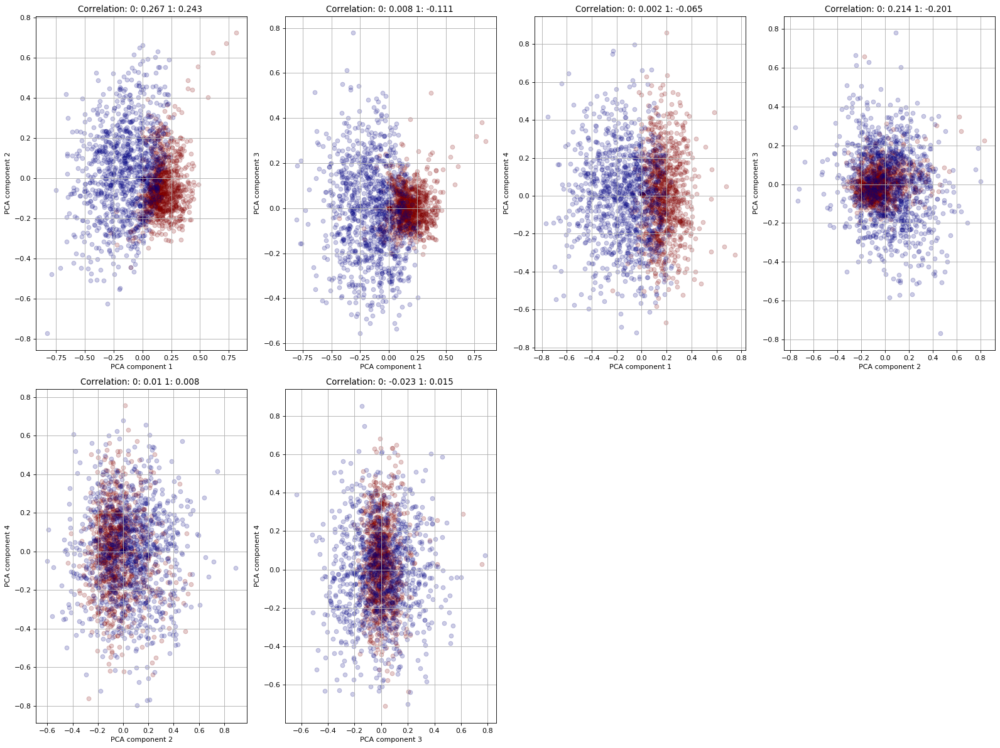

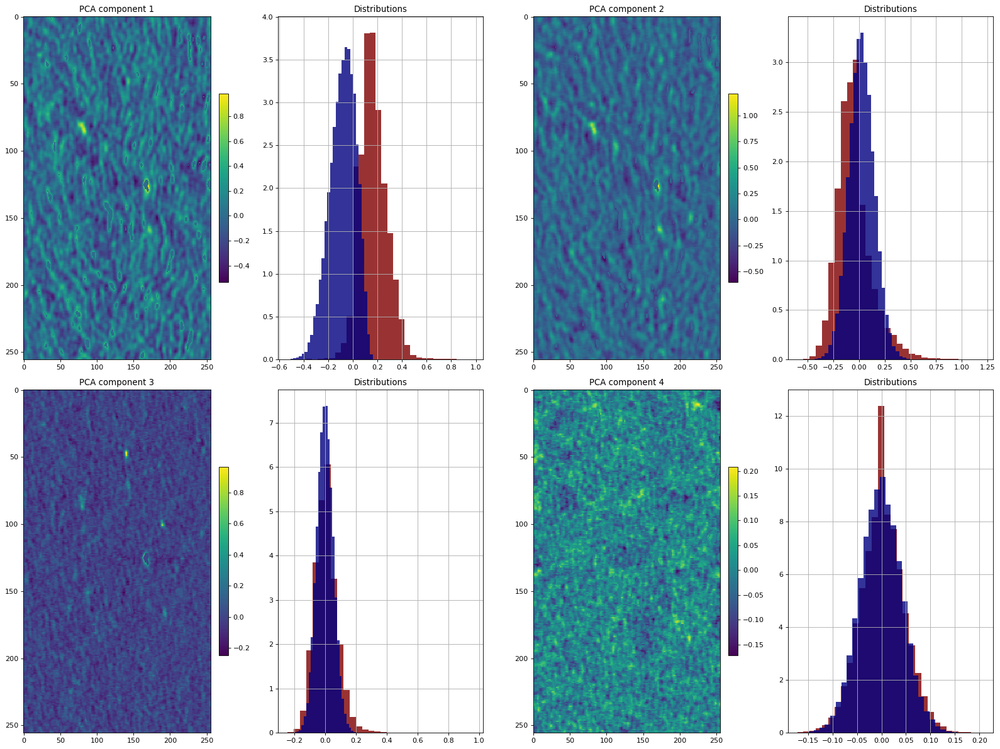

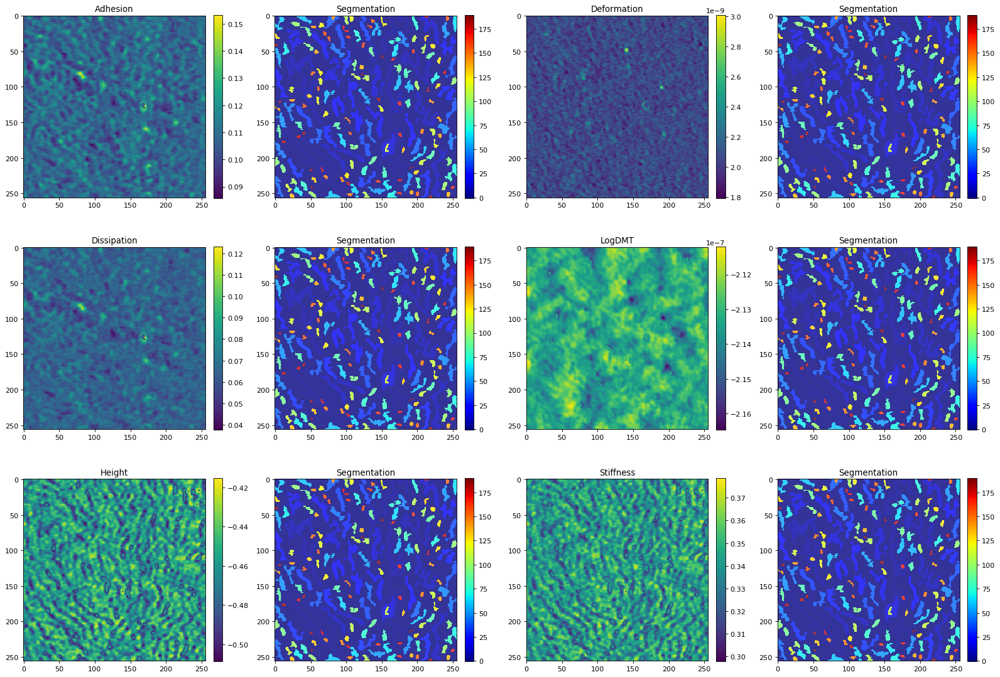

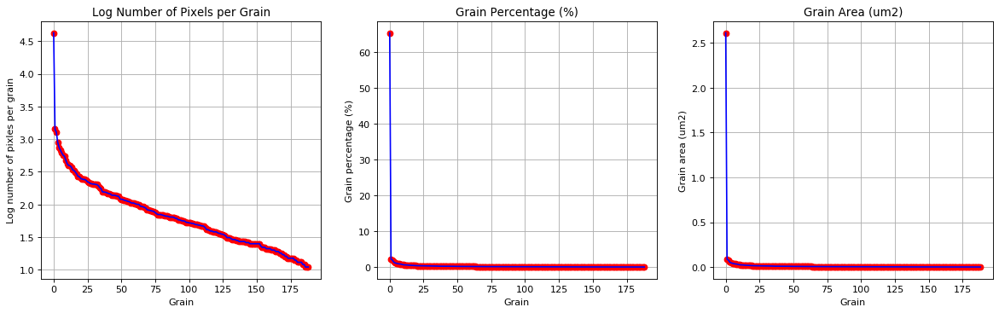

-----------0---------------------------------
--------------------0------------------------
-----------------------------0---------------


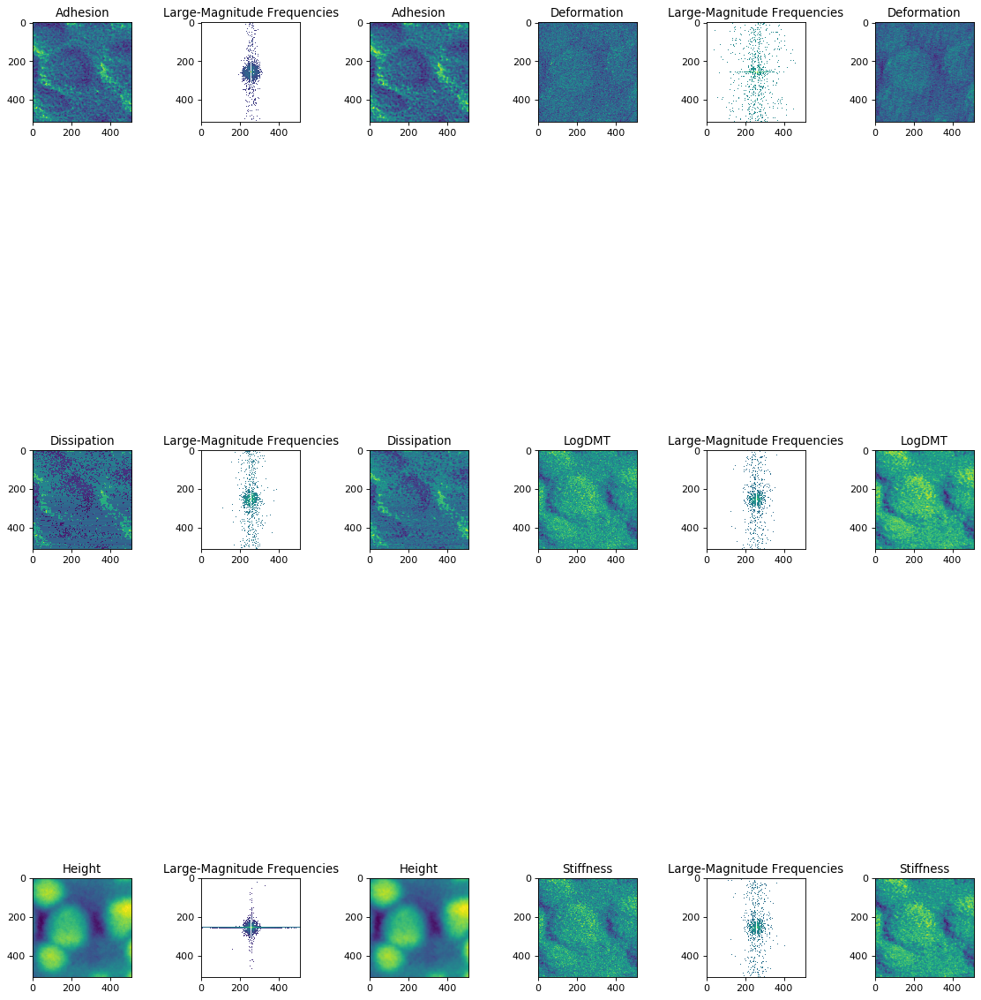

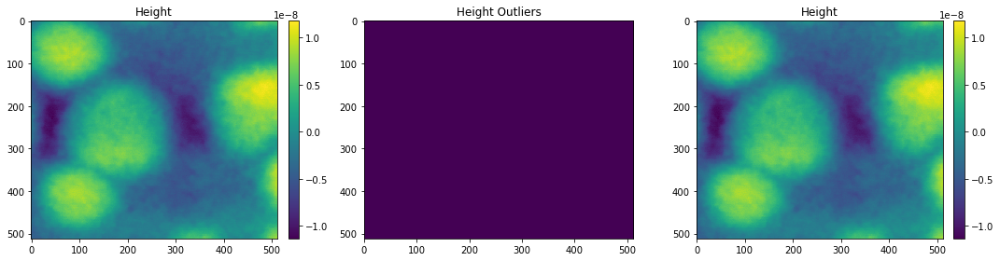

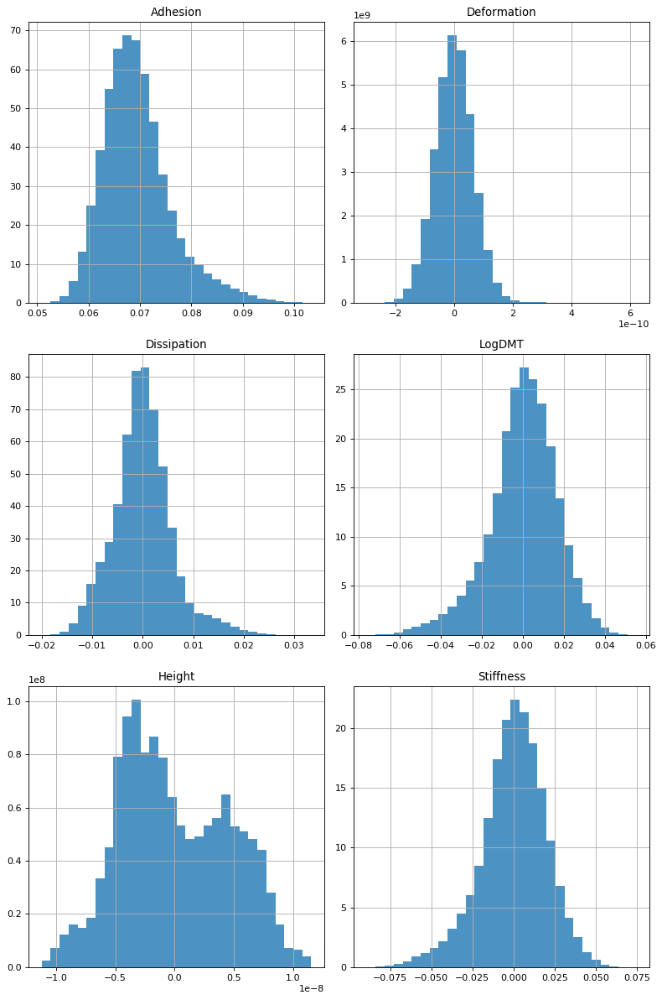

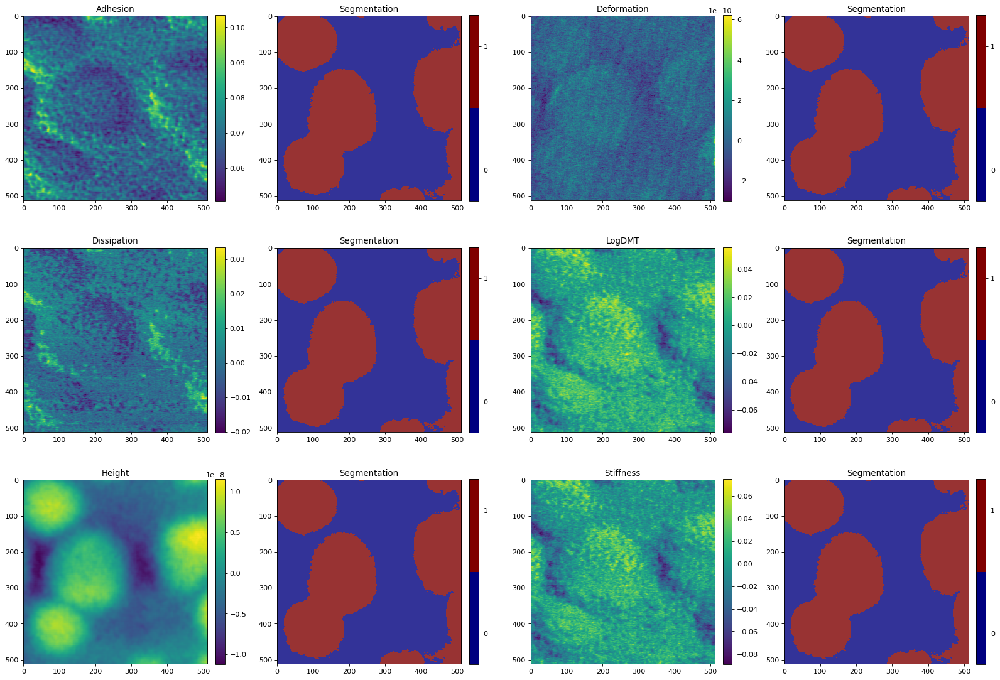

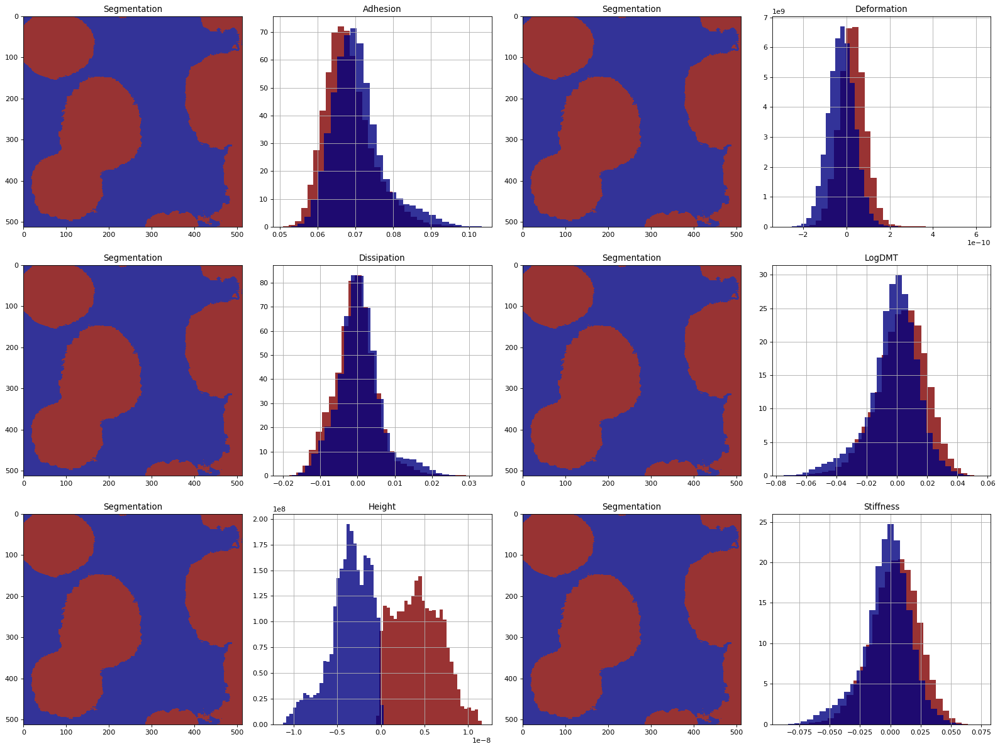

...

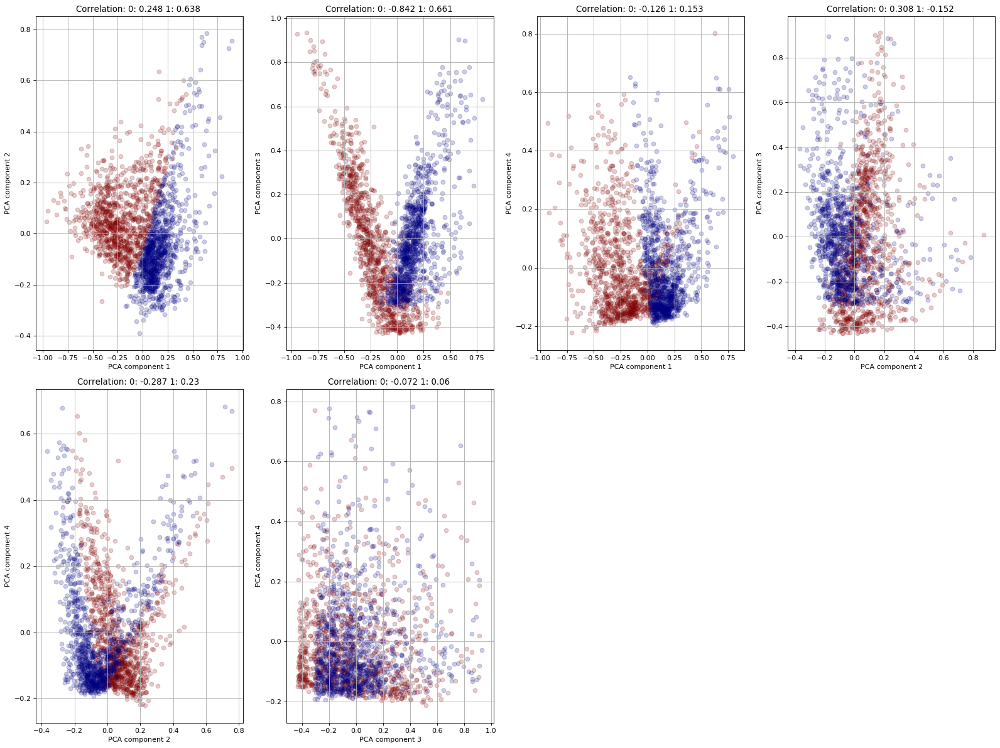

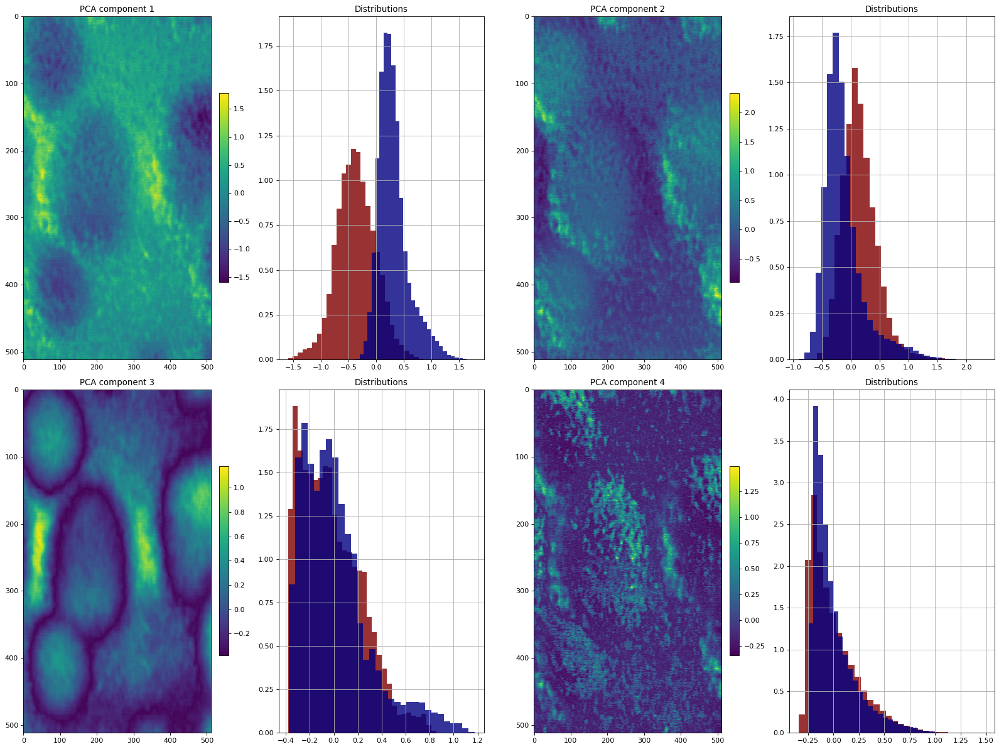

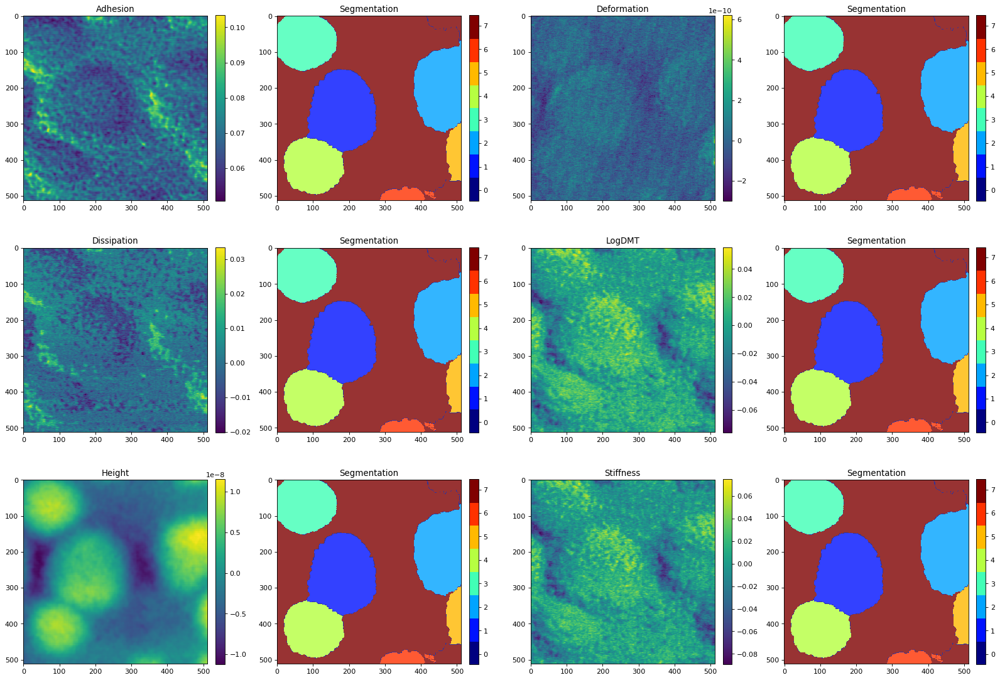

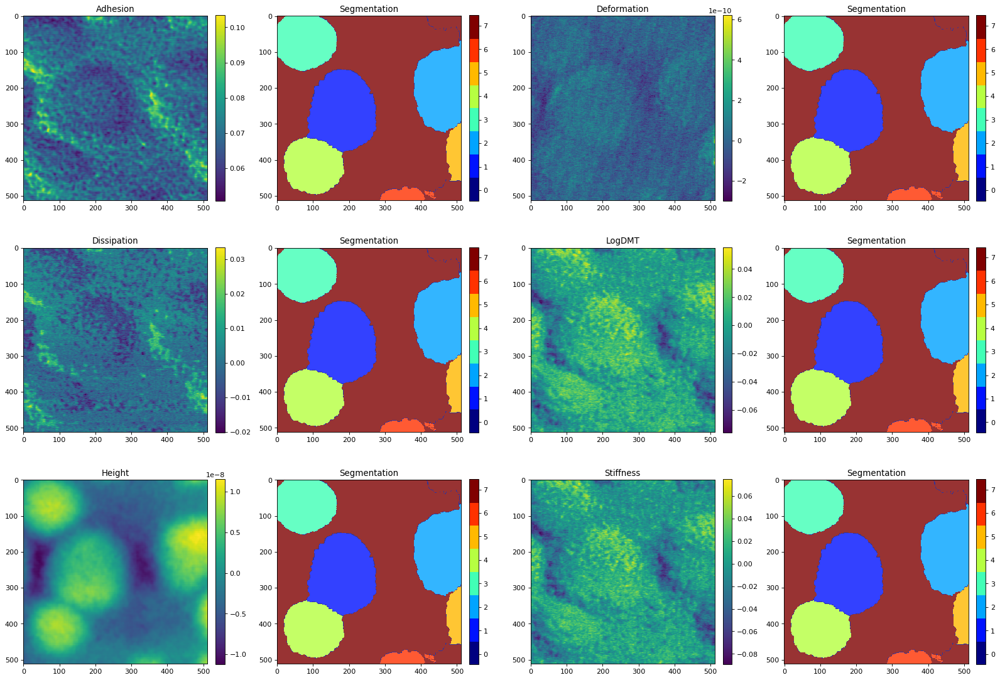

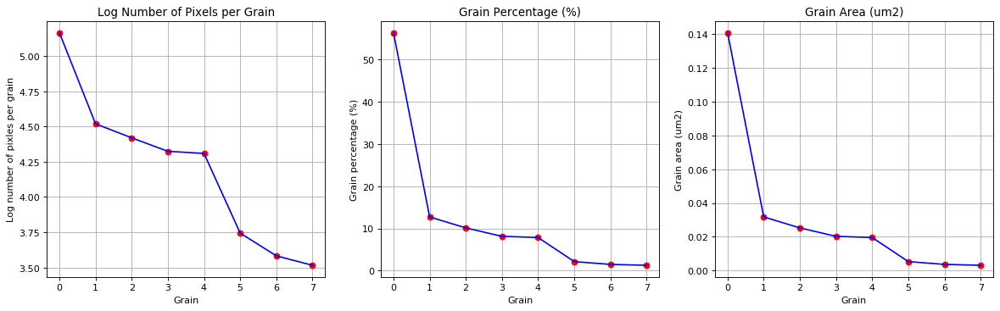

-----------1---------------------------------
--------------------1------------------------
-----------------------------1---------------


In [15]:
ims = [im_opv, im_PTB7]
n_components = [2, 2]
heightless = [False, False]
outlier_threshold = [2.5, 2.5]
padding = 0
embedding_dim = 4 ## Corresponds to # of PCA components
thresh = [None, 0.3]     ## Persistence Watershed Threshold (if None, then connected components is used)
nonlinear = True  ## appends square, cube, absolute value, and reciprocal of each channel to examine nonlinear correlations
normalize = True
zscale = False
data_type = ['QNM', 'QNM']   ## Refers to SPM technique used to gather data. Corresponds to config.py keys
data_subtype = ['Backgrounded', '2ComponentFilms']  ## Refers to sample or experiment specific parameters (_e.g._ image size) in config.py
input_cmap = ['jet','jet']

seg1_dict = {}    
seg2_dict = {}

phases = {}
grains = {}

h = 0
for h, im in enumerate(ims):
    outliers, seg1_labels, seg2_labels = m2py_pipeline(im, heightless = heightless[h],
                                                          n_components = n_components[h],
                                                          outlier_threshold = outlier_threshold[h],
                                                          padding = padding,
                                                          embedding_dim = embedding_dim,
                                                          thresh = thresh[h],
                                                          nonlinear = nonlinear,
                                                          normalize = normalize,
                                                          zscale = zscale,
                                                          data_type = data_type[h],
                                                          data_subtype = data_subtype[h],
                                                          input_cmap = input_cmap[h])
    
    print (f'-----------{h}---------------------------------')
    print (f'--------------------{h}------------------------')
    print (f'-----------------------------{h}---------------')
    
    seg1_dict[h] = seg1_labels
    seg2_dict[h] = seg2_labels
    
    phases[h] = slu.phase_sort(im, seg1_labels, n_components)
    grains[h] = slu.grain_sort(im, seg2_labels)

In [16]:
phases

{0: {1: array([[ 1.0695e-01,  2.1719e-09,  6.2074e-02, -2.1370e-07, -4.5556e-01,
           3.4784e-01],
         [ 1.0398e-01,  2.1633e-09,  6.1918e-02, -2.1368e-07, -4.7212e-01,
           3.3139e-01],
         [ 1.0476e-01,  2.0173e-09,  6.1766e-02, -2.1391e-07, -4.6864e-01,
           3.3059e-01],
         ...,
         [ 1.0546e-01,  2.1654e-09,  6.3255e-02, -2.1347e-07, -4.7713e-01,
           3.2727e-01],
         [ 1.0846e-01,  2.0864e-09,  6.3256e-02, -2.1373e-07, -4.6050e-01,
           3.4297e-01],
         [ 1.0886e-01,  2.0074e-09,  6.3257e-02, -2.1376e-07, -4.5314e-01,
           3.5868e-01]]),
  2: array([[ 9.9671e-02,  1.8517e-09,  5.9589e-02, -2.1227e-07, -4.6683e-01,
           3.3485e-01],
         [ 1.0117e-01,  1.9436e-09,  5.9520e-02, -2.1227e-07, -4.6334e-01,
           3.3448e-01],
         [ 1.1198e-01,  1.9824e-09,  7.4644e-02, -2.1300e-07, -4.7922e-01,
           3.3162e-01],
         ...,
         [ 9.6676e-02,  2.1432e-09,  6.3154e-02, -2.1260e-07, -4.6170e

In [21]:
grains[0][0].shape

(501, 6)

### Confirm # of phases and grains for each iteration makes sense

In [ ]:
for v in p_stats.values():
    print (len(v))

In [ ]:
for v in g_stats.values():
    print (len(v))

### Exploring dictionary levels

In [ ]:
for k,v in p_stats.items():
    print (f"Image: {k}")
    for k1,v1 in v.items():
        print (f"phase: {k1}")
        phase = pd.DataFrame.from_dict(v1)
        for k2,v2 in phase.iteritems():
            print (qnm_fields[k2])
            print (f"median:{v2[0]}")
            print (f"std_dev: {v2[1]}")

In [ ]:
prop_stats = gen_prop_stats(p_stats)

In [ ]:
prop_stats

In [ ]:
## need to take plotting outside of loop to be able to plot all image stats together

## creating x-axis list of lists
X = [0,1,2,3,4,5,6]  
xx = []
for i in X:
    xx.append(np.full((1,(i+1)), i))
    
fig = plt.figure(figsize = (10,15))
## for each key and property stat dict:
for k,v in prop_stats.items():
#     print (v)
    
    ##for each property in the property stat dict:
    for i, prop in enumerate(v):
        print (prop)
        
        ## need to make yy = [[im0_p0], [im1_p0, im1_p1], [im2_p0, im2_p1, im2_p2],...]
        yy = prop[0]
        print (yy.shape)
        
        plt.subplot(3,2,i+1)
        plt.scatter(xx, yy)
        plt.ylim((prop[0].min()-(prop[0].min()*0.01)),(prop[0].max()+(prop[0].max()*0.01)))
        plt.title(qnm_fields[i])

    plt.tight_layout()
    plt.show()
#plot the gathered values for a given image

In [ ]:
props

### Now that the median, std dev, and var of each property of each phase and grain is calculated, these values need to be collected and plotted for the whole sample

#### For each dictionary (_i.e._ p_stats and g_stats), a plot for each property will be generated with the median of each phase or grain as the plotted data point.

#### std dev can be used to add error bars to these plots or plotted separately